In [105]:
#import libraries
# First let's import the packages we will use in this project
# You can do this all now or as you need them
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)


# Now we need to read in the data
df = pd.read_csv(r'C:\Users\JACQY\Downloads\movies.csv')



In [106]:
# Now let's take a look at the data

df.head()

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,votes,writer,year
0,19000000.0,Warner Bros.,United Kingdom,Stanley Kubrick,Drama,46998772.0,The Shining,R,"June 13, 1980 (United States)",146.0,8.4,Jack Nicholson,927000.0,Stephen King,1980
1,4500000.0,Columbia Pictures,United States,Randal Kleiser,Adventure,58853106.0,The Blue Lagoon,R,"July 2, 1980 (United States)",104.0,5.8,Brooke Shields,65000.0,Henry De Vere Stacpoole,1980
2,18000000.0,Lucasfilm,United States,Irvin Kershner,Action,538375067.0,Star Wars: Episode V - The Empire Strikes Back,PG,"June 20, 1980 (United States)",124.0,8.7,Mark Hamill,1200000.0,Leigh Brackett,1980
3,3500000.0,Paramount Pictures,United States,Jim Abrahams,Comedy,83453539.0,Airplane!,PG,"July 2, 1980 (United States)",88.0,7.7,Robert Hays,221000.0,Jim Abrahams,1980
4,6000000.0,Orion Pictures,United States,Harold Ramis,Comedy,39846344.0,Caddyshack,R,"July 25, 1980 (United States)",98.0,7.3,Chevy Chase,108000.0,Brian Doyle-Murray,1980


In [121]:
# We need to see if we have any missing data
# Let's loop through the data and see if there is anything missing

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))
# Replace non-finite values with 0
df['budget'] = df['budget'].fillna(0)
df['budget'] = df['budget'].replace([np.inf, -np.inf], 0)
df['gross'] = df['gross'].fillna(0)
df['budget'] = df['gross'].replace([np.inf, -np.inf], 0)

# Drop rows containing non-finite values
df = df.dropna(subset=['budget'])
df = df.dropna(subset=['gross'])
  

budget - 0%
company - 0%
country - 0%
director - 0%
genre - 0%
gross - 0%
name - 0%
rating - 0%
released - 0%
runtime - 0%
score - 0%
star - 0%
votes - 0%
writer - 0%
year - 0%


In [108]:
# Data Types for our columns

print(df.dtypes)

budget      float64
company      object
country      object
director     object
genre        object
gross       float64
name         object
rating       object
released     object
runtime     float64
score       float64
star         object
votes       float64
writer       object
year          int64
dtype: object


In [122]:
#Change datatype of columns

df['budget'] = df['budget'].astype('int64')

df['gross'] = df['gross'].astype('int64')

In [143]:
df.head()

,budget,company,country,director,genre,gross,name,rating,runtime,score,star,votes,writer,yearcorrect
5445,2847246203,Twentieth Century Fox,United States,James Cameron,Action,2847246203,Avatar,PG-13,162.0,7.8,Sam Worthington,1100000.0,James Cameron,2009
7445,2797501328,Marvel Studios,United States,Anthony Russo,Action,2797501328,Avengers: Endgame,PG-13,181.0,8.4,Robert Downey Jr.,903000.0,Christopher Markus,2019
3045,2201647264,Twentieth Century Fox,United States,James Cameron,Drama,2201647264,Titanic,PG-13,194.0,7.8,Leonardo DiCaprio,1100000.0,James Cameron,1997
6663,2069521700,Lucasfilm,United States,J.J. Abrams,Action,2069521700,Star Wars: Episode VII - The Force Awakens,PG-13,138.0,7.8,Daisy Ridley,876000.0,Lawrence Kasdan,2015
7244,2048359754,Marvel Studios,United States,Anthony Russo,Action,2048359754,Avengers: Infinity War,PG-13,149.0,8.4,Robert Downey Jr.,897000.0,Christopher Markus,2018


In [124]:
# define the appropriate date released
df['yearcorrect'] = df['released'].str.extract(pat = '([0-9]{4})').astype(int)
df = df.drop('released', axis=1)
df = df.drop('year', axis=1)
df

,budget,company,country,director,genre,gross,name,rating,runtime,score,star,votes,writer,yearcorrect
5445,2847246203,Twentieth Century Fox,United States,James Cameron,Action,2847246203,Avatar,PG-13,162.0,7.8,Sam Worthington,1100000.0,James Cameron,2009
7445,2797501328,Marvel Studios,United States,Anthony Russo,Action,2797501328,Avengers: Endgame,PG-13,181.0,8.4,Robert Downey Jr.,903000.0,Christopher Markus,2019
3045,2201647264,Twentieth Century Fox,United States,James Cameron,Drama,2201647264,Titanic,PG-13,194.0,7.8,Leonardo DiCaprio,1100000.0,James Cameron,1997
6663,2069521700,Lucasfilm,United States,J.J. Abrams,Action,2069521700,Star Wars: Episode VII - The Force Awakens,PG-13,138.0,7.8,Daisy Ridley,876000.0,Lawrence Kasdan,2015
7244,2048359754,Marvel Studios,United States,Anthony Russo,Action,2048359754,Avengers: Infinity War,PG-13,149.0,8.4,Robert Downey Jr.,897000.0,Christopher Markus,2018
7480,1670727580,Walt Disney Pictures,United States,Jon Favreau,Animation,1670727580,The Lion King,PG,118.0,6.9,Donald Glover,222000.0,Jeff Nathanson,2019
6653,1670516444,Universal Pictures,United States,Colin Trevorrow,Action,1670516444,Jurassic World,PG-13,124.0,7.0,Chris Pratt,593000.0,Rick Jaffa,2015
6043,1518815515,Marvel Studios,United States,Joss Whedon,Action,1518815515,The Avengers,PG-13,143.0,8.0,Robert Downey Jr.,1300000.0,Joss Whedon,2012
6646,1515341399,Universal Pictures,United States,James Wan,Action,1515341399,Furious 7,PG-13,137.0,7.1,Vin Diesel,370000.0,Chris Morgan,2015
7494,1450026933,Walt Disney Animation Studios,United States,Chris Buck,Animation,1450026933,Frozen II,PG,103.0,6.8,Kristen Bell,148000.0,Jennifer Lee,2019


In [125]:
# Order our Data a little bit to see

df=df.sort_values(by=['gross'], inplace=False, ascending=False)

In [127]:
pd.set_option('display.max_rows', None)

df

,budget,company,country,director,genre,gross,name,rating,runtime,score,star,votes,writer,yearcorrect
5445,2847246203,Twentieth Century Fox,United States,James Cameron,Action,2847246203,Avatar,PG-13,162.0,7.8,Sam Worthington,1100000.0,James Cameron,2009
7445,2797501328,Marvel Studios,United States,Anthony Russo,Action,2797501328,Avengers: Endgame,PG-13,181.0,8.4,Robert Downey Jr.,903000.0,Christopher Markus,2019
3045,2201647264,Twentieth Century Fox,United States,James Cameron,Drama,2201647264,Titanic,PG-13,194.0,7.8,Leonardo DiCaprio,1100000.0,James Cameron,1997
6663,2069521700,Lucasfilm,United States,J.J. Abrams,Action,2069521700,Star Wars: Episode VII - The Force Awakens,PG-13,138.0,7.8,Daisy Ridley,876000.0,Lawrence Kasdan,2015
7244,2048359754,Marvel Studios,United States,Anthony Russo,Action,2048359754,Avengers: Infinity War,PG-13,149.0,8.4,Robert Downey Jr.,897000.0,Christopher Markus,2018
7480,1670727580,Walt Disney Pictures,United States,Jon Favreau,Animation,1670727580,The Lion King,PG,118.0,6.9,Donald Glover,222000.0,Jeff Nathanson,2019
6653,1670516444,Universal Pictures,United States,Colin Trevorrow,Action,1670516444,Jurassic World,PG-13,124.0,7.0,Chris Pratt,593000.0,Rick Jaffa,2015
6043,1518815515,Marvel Studios,United States,Joss Whedon,Action,1518815515,The Avengers,PG-13,143.0,8.0,Robert Downey Jr.,1300000.0,Joss Whedon,2012
6646,1515341399,Universal Pictures,United States,James Wan,Action,1515341399,Furious 7,PG-13,137.0,7.1,Vin Diesel,370000.0,Chris Morgan,2015
7494,1450026933,Walt Disney Animation Studios,United States,Chris Buck,Animation,1450026933,Frozen II,PG,103.0,6.8,Kristen Bell,148000.0,Jennifer Lee,2019


In [130]:
# drop any duplicate
df['company'].drop_duplicates().sort_values(ascending=False)

7129                                              thefyzz
5664                                          micro_scope
4007                                             i5 Films
6793                                           i am OTHER
6420                                                 erbp
3776                                       double A Films
3330                          Zucker Brothers Productions
520                                      Zoetrope Studios
2213                                   Zeta Entertainment
3698                              Zentropa Entertainments
1180                                 Zenith Entertainment
5180                                      Zazen Produções
1321                             Zanuck/Brown Productions
1329                          Zacharias-Buhai Productions
789                             Young Sung Production Co.
5125                           Young Hannibal Productions
5499                                          Yellow Bird
4618          

In [144]:
df.head()

,budget,company,country,director,genre,gross,name,rating,runtime,score,star,votes,writer,yearcorrect
5445,2847246203,Twentieth Century Fox,United States,James Cameron,Action,2847246203,Avatar,PG-13,162.0,7.8,Sam Worthington,1100000.0,James Cameron,2009
7445,2797501328,Marvel Studios,United States,Anthony Russo,Action,2797501328,Avengers: Endgame,PG-13,181.0,8.4,Robert Downey Jr.,903000.0,Christopher Markus,2019
3045,2201647264,Twentieth Century Fox,United States,James Cameron,Drama,2201647264,Titanic,PG-13,194.0,7.8,Leonardo DiCaprio,1100000.0,James Cameron,1997
6663,2069521700,Lucasfilm,United States,J.J. Abrams,Action,2069521700,Star Wars: Episode VII - The Force Awakens,PG-13,138.0,7.8,Daisy Ridley,876000.0,Lawrence Kasdan,2015
7244,2048359754,Marvel Studios,United States,Anthony Russo,Action,2048359754,Avengers: Infinity War,PG-13,149.0,8.4,Robert Downey Jr.,897000.0,Christopher Markus,2018


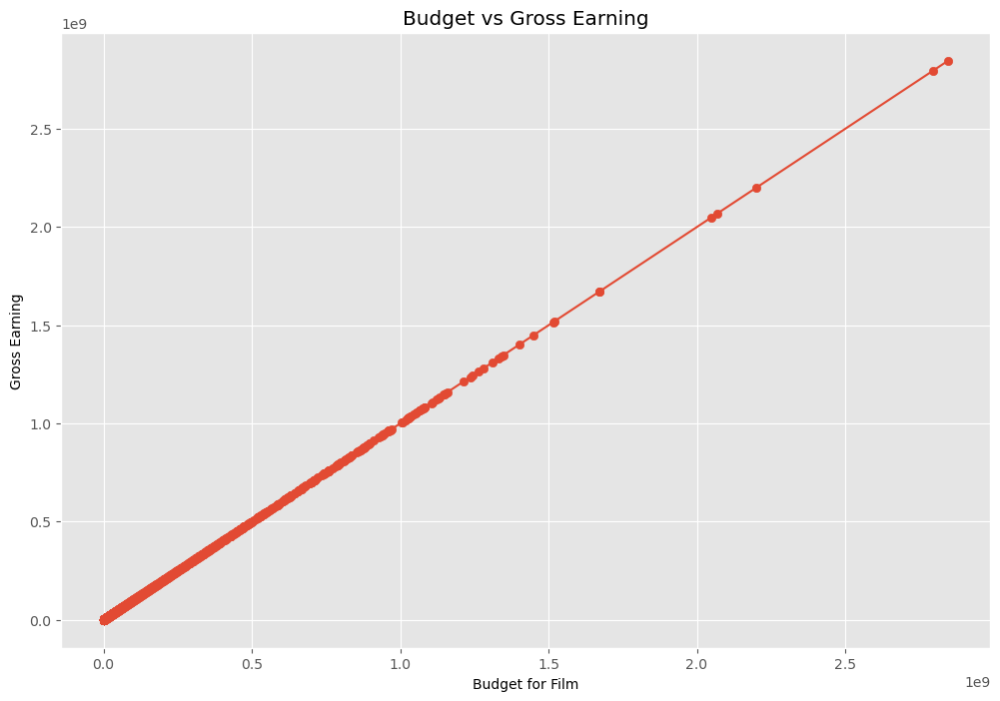

In [132]:
#scatter plot with budget vs gross

m, b = np.polyfit(x=df['budget'], y=df['gross'], deg=1)
line = m * np.array(df['budget']) + b

plt.scatter(x=df['budget'], y=df['gross'])

# add the line of best fit
plt.plot(df['budget'], line)

plt.title('Budget vs Gross Earning')
plt.xlabel('Budget for Film')
plt.ylabel('Gross Earning')

plt.show()

In [61]:
df.head()

,budget,company,country,director,genre,gross,name,rating,runtime,score,star,votes,writer,yearcorrect
5445,237000000,Twentieth Century Fox,United States,James Cameron,Action,2847246203,Avatar,PG-13,162.0,7.8,Sam Worthington,1100000.0,James Cameron,2009
7445,356000000,Marvel Studios,United States,Anthony Russo,Action,2797501328,Avengers: Endgame,PG-13,181.0,8.4,Robert Downey Jr.,903000.0,Christopher Markus,2019
3045,200000000,Twentieth Century Fox,United States,James Cameron,Drama,2201647264,Titanic,PG-13,194.0,7.8,Leonardo DiCaprio,1100000.0,James Cameron,1997
6663,245000000,Lucasfilm,United States,J.J. Abrams,Action,2069521700,Star Wars: Episode VII - The Force Awakens,PG-13,138.0,7.8,Daisy Ridley,876000.0,Lawrence Kasdan,2015
7244,321000000,Marvel Studios,United States,Anthony Russo,Action,2048359754,Avengers: Infinity War,PG-13,149.0,8.4,Robert Downey Jr.,897000.0,Christopher Markus,2018


<Axes: xlabel='budget', ylabel='gross'>

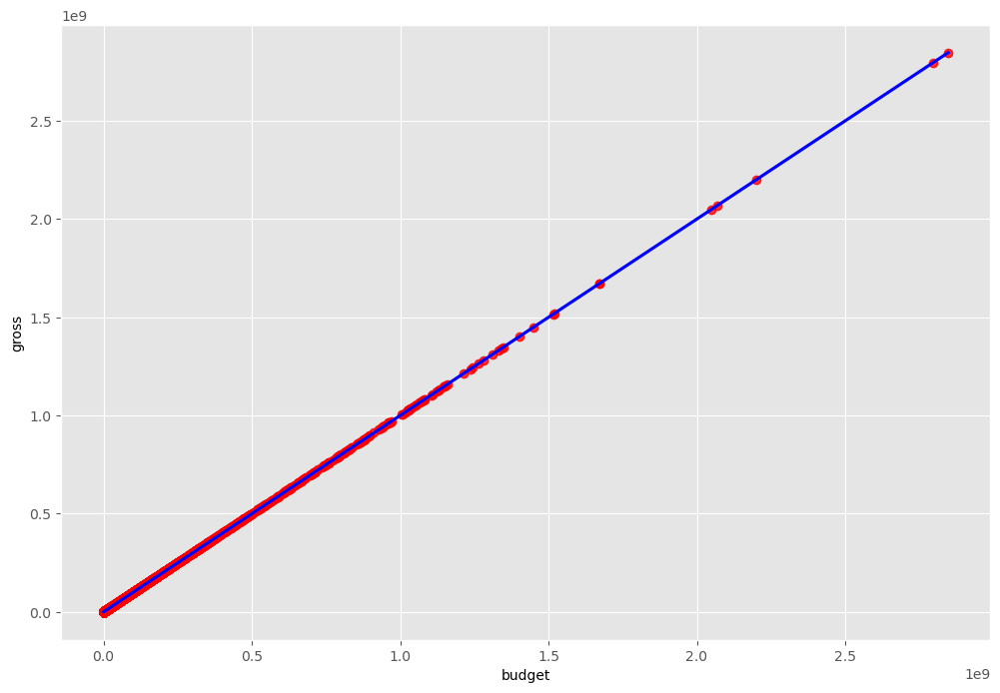

In [133]:
sns.regplot(x='budget', y='gross', data=df, scatter_kws={"color": "red"}, line_kws={"color": "blue"}) 

In [134]:
#lOOKING FOR CORRELATIO
df.corr(numeric_only=True)

,budget,gross,runtime,score,votes,yearcorrect
budget,1.000000,1.000000,0.276021,0.223111,0.616182,0.270040
gross,1.000000,1.000000,0.276021,0.223111,0.616182,0.270040
runtime,0.276021,0.276021,1.000000,0.416757,0.352721,0.078340
score,0.223111,0.223111,0.416757,1.000000,0.472140,0.066722
votes,0.616182,0.616182,0.352721,0.472140,1.000000,0.206486
yearcorrect,0.270040,0.270040,0.078340,0.066722,0.206486,1.000000


In [135]:
df.corr(method="pearson", numeric_only=True)

,budget,gross,runtime,score,votes,yearcorrect
budget,1.000000,1.000000,0.276021,0.223111,0.616182,0.270040
gross,1.000000,1.000000,0.276021,0.223111,0.616182,0.270040
runtime,0.276021,0.276021,1.000000,0.416757,0.352721,0.078340
score,0.223111,0.223111,0.416757,1.000000,0.472140,0.066722
votes,0.616182,0.616182,0.352721,0.472140,1.000000,0.206486
yearcorrect,0.270040,0.270040,0.078340,0.066722,0.206486,1.000000


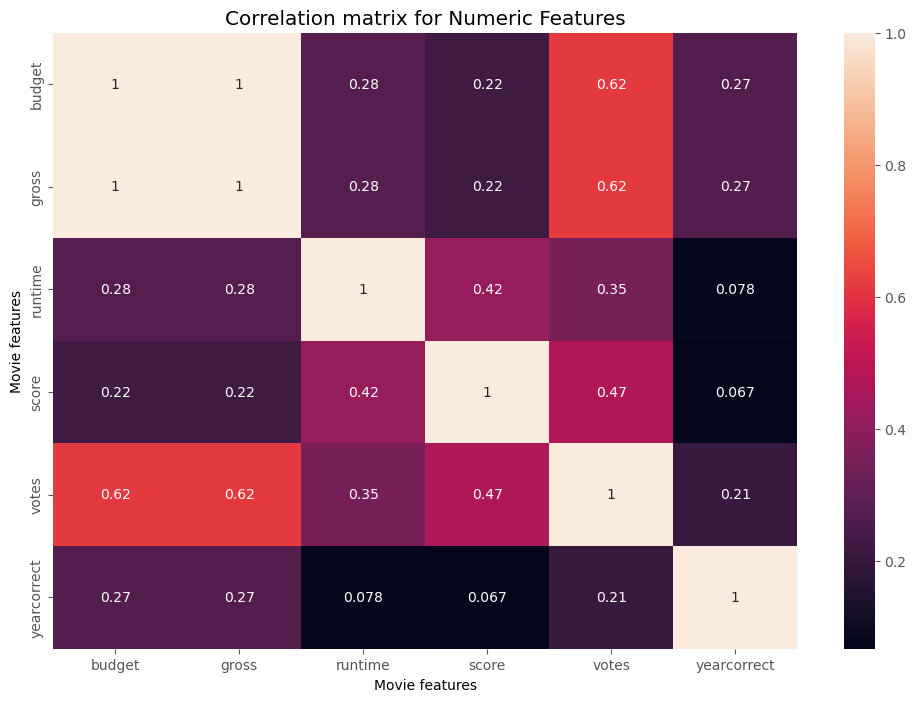

In [136]:
#high correlation between budget and gross
correlation_matrix = df.corr(method="pearson", numeric_only=True)

sns.heatmap(correlation_matrix, annot = True)

plt.title("Correlation matrix for Numeric Features")

plt.xlabel("Movie features")

plt.ylabel("Movie features")

plt.show()

In [137]:
#Looking at company
df.head(50)

,budget,company,country,director,genre,gross,name,rating,runtime,score,star,votes,writer,yearcorrect
5445,2847246203,Twentieth Century Fox,United States,James Cameron,Action,2847246203,Avatar,PG-13,162.0,7.8,Sam Worthington,1100000.0,James Cameron,2009
7445,2797501328,Marvel Studios,United States,Anthony Russo,Action,2797501328,Avengers: Endgame,PG-13,181.0,8.4,Robert Downey Jr.,903000.0,Christopher Markus,2019
3045,2201647264,Twentieth Century Fox,United States,James Cameron,Drama,2201647264,Titanic,PG-13,194.0,7.8,Leonardo DiCaprio,1100000.0,James Cameron,1997
6663,2069521700,Lucasfilm,United States,J.J. Abrams,Action,2069521700,Star Wars: Episode VII - The Force Awakens,PG-13,138.0,7.8,Daisy Ridley,876000.0,Lawrence Kasdan,2015
7244,2048359754,Marvel Studios,United States,Anthony Russo,Action,2048359754,Avengers: Infinity War,PG-13,149.0,8.4,Robert Downey Jr.,897000.0,Christopher Markus,2018
7480,1670727580,Walt Disney Pictures,United States,Jon Favreau,Animation,1670727580,The Lion King,PG,118.0,6.9,Donald Glover,222000.0,Jeff Nathanson,2019
6653,1670516444,Universal Pictures,United States,Colin Trevorrow,Action,1670516444,Jurassic World,PG-13,124.0,7.0,Chris Pratt,593000.0,Rick Jaffa,2015
6043,1518815515,Marvel Studios,United States,Joss Whedon,Action,1518815515,The Avengers,PG-13,143.0,8.0,Robert Downey Jr.,1300000.0,Joss Whedon,2012
6646,1515341399,Universal Pictures,United States,James Wan,Action,1515341399,Furious 7,PG-13,137.0,7.1,Vin Diesel,370000.0,Chris Morgan,2015
7494,1450026933,Walt Disney Animation Studios,United States,Chris Buck,Animation,1450026933,Frozen II,PG,103.0,6.8,Kristen Bell,148000.0,Jennifer Lee,2019


In [138]:
df_numerized = df.copy()

for col_name in df_numerized.columns: 
    if df_numerized[col_name].dtype.name == 'object':
        df_numerized[col_name] = df_numerized[col_name].astype('category')
    elif df_numerized[col_name].dtype.name == 'category':
        df_numerized[col_name] = df_numerized[col_name].cat.codes
        
df_numerized.head()

,budget,company,country,director,genre,gross,name,rating,runtime,score,star,votes,writer,yearcorrect
5445,2847246203,Twentieth Century Fox,United States,James Cameron,Action,2847246203,Avatar,PG-13,162.0,7.8,Sam Worthington,1100000.0,James Cameron,2009
7445,2797501328,Marvel Studios,United States,Anthony Russo,Action,2797501328,Avengers: Endgame,PG-13,181.0,8.4,Robert Downey Jr.,903000.0,Christopher Markus,2019
3045,2201647264,Twentieth Century Fox,United States,James Cameron,Drama,2201647264,Titanic,PG-13,194.0,7.8,Leonardo DiCaprio,1100000.0,James Cameron,1997
6663,2069521700,Lucasfilm,United States,J.J. Abrams,Action,2069521700,Star Wars: Episode VII - The Force Awakens,PG-13,138.0,7.8,Daisy Ridley,876000.0,Lawrence Kasdan,2015
7244,2048359754,Marvel Studios,United States,Anthony Russo,Action,2048359754,Avengers: Infinity War,PG-13,149.0,8.4,Robert Downey Jr.,897000.0,Christopher Markus,2018


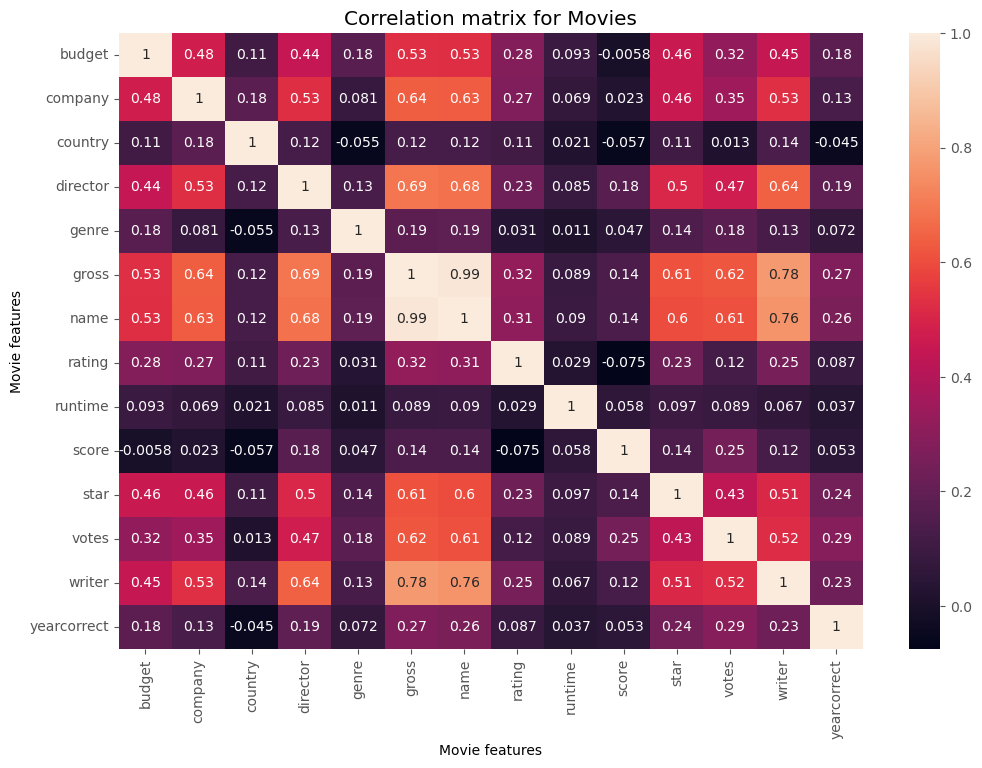

In [98]:
correlation_matrix = df.apply(lambda x: x.factorize()[0]).corr(method='pearson')

sns.heatmap(correlation_matrix, annot = True)

plt.title("Correlation matrix for Movies")

plt.xlabel("Movie features")

plt.ylabel("Movie features")

plt.show()

In [139]:
correlation_mat = df.apply(lambda x: x.factorize()[0]).corr()

corr_pairs = correlation_mat.unstack()

print(corr_pairs)

budget       budget         1.000000
             company        0.646371
             country        0.129048
             director       0.702102
             genre          0.186636
             gross          1.000000
             name           0.986927
             rating         0.309952
             runtime        0.092277
             score          0.147087
             star           0.626502
             votes          0.622953
             writer         0.781871
             yearcorrect    0.283411
company      budget         0.646371
             company        1.000000
             country        0.181000
             director       0.545569
             genre          0.088843
             gross          0.646371
             name           0.641473
             rating         0.265128
             runtime        0.075156
             score          0.035740
             star           0.480750
             votes          0.358708
             writer         0.547007
 

In [140]:
sorted_pairs = corr_pairs.sort_values(kind="quicksort")

print(sorted_pairs)

rating       score         -0.070926
score        rating        -0.070926
             country       -0.056638
country      score         -0.056638
genre        country       -0.052459
country      genre         -0.052459
             yearcorrect   -0.036125
yearcorrect  country       -0.036125
genre        runtime        0.013887
runtime      genre          0.013887
country      votes          0.016991
votes        country        0.016991
rating       runtime        0.029194
runtime      rating         0.029194
             country        0.029646
country      runtime        0.029646
rating       genre          0.030561
genre        rating         0.030561
score        company        0.035740
company      score          0.035740
yearcorrect  runtime        0.041400
runtime      yearcorrect    0.041400
score        genre          0.052770
genre        score          0.052770
yearcorrect  score          0.058295
score        yearcorrect    0.058295
             runtime        0.058818
r

In [142]:
# We can now take a look at the ones that have a high correlation (> 0.5)

strong_pairs = sorted_pairs[abs(sorted_pairs) > 0.5]

print(strong_pairs)

star         director       0.526883
director     star           0.526883
votes        writer         0.527066
writer       votes          0.527066
             star           0.529317
star         writer         0.529317
director     company        0.545569
company      director       0.545569
writer       company        0.547007
company      writer         0.547007
votes        name           0.611303
name         votes          0.611303
star         name           0.614784
name         star           0.614784
votes        gross          0.622953
budget       votes          0.622953
votes        budget         0.622953
gross        votes          0.622953
             star           0.626502
star         gross          0.626502
             budget         0.626502
budget       star           0.626502
name         company        0.641473
company      name           0.641473
gross        company        0.646371
company      budget         0.646371
budget       company        0.646371
c